# Xintong Wu (xw225) STATS 202 HW5

### About more discussion please refer to the open GitHub page: https://github.com/Xintong1122/STATS202HW5

In [ ]:
# First uninstall any existing pgmpy versions
!pip uninstall pgmpy -y

# Install specific working version of pgmpy
!pip install pgmpy==0.1.9

# Install other required packages
!pip install pandas numpy matplotlib seaborn networkx

!pip install numpy==1.23.5

Found existing installation: pgmpy 0.1.9
Uninstalling pgmpy-0.1.9:
  Successfully uninstalled pgmpy-0.1.9
  Using cached pgmpy-0.1.9-py3-none-any.whl.metadata (688 bytes)
Using cached pgmpy-0.1.9-py3-none-any.whl (331 kB)


In [ ]:
import pandas as pd
import numpy as np
from pgmpy.models import BayesianModel
from pgmpy.estimators import MaximumLikelihoodEstimator
from pgmpy.inference import VariableElimination
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

### 1. Data preparation

In [ ]:
# Load the dataset from GitHub
url = "https://raw.githubusercontent.com/Xintong1122/STATS202HW5/refs/heads/main/Data/students.csv"
df = pd.read_csv(url)

# Data cleaning steps
print("Initial data shape:", df.shape)
print("\nMissing values before cleaning:")
print(df.isnull().sum())

# Handle missing values
# For numeric columns, fill with median (more robust than mean)
numeric_cols = ['age', 'Medu', 'Fedu', 'traveltime', 'studytime',
               'failures', 'Dalc', 'Walc', 'absences', 'midterm', 'final']
for col in numeric_cols:
    if col in df.columns:
        df[col].fillna(df[col].median(), inplace=True)

# For categorical columns, fill with mode
categorical_cols = ['gender', 'famsize', 'Mjob', 'Fjob', 'schoolsup',
                   'famsup', 'paid', 'activities', 'higher']
for col in categorical_cols:
    if col in df.columns:
        df[col].fillna(df[col].mode()[0], inplace=True)

print("\nMissing values after cleaning:")
print(df.isnull().sum())

# Create a copy of the dataframe for modifications
student_df = df.copy()

Initial data shape: (395, 21)

Missing values before cleaning:
gender        0
age           0
famsize       0
Medu          0
Fedu          0
Mjob          0
Fjob          0
traveltime    0
studytime     0
failures      0
schoolsup     0
famsup        0
paid          0
activities    0
higher        0
freetime      0
Dalc          0
Walc          0
absences      0
midterm       0
final         0
dtype: int64

Missing values after cleaning:
gender        0
age           0
famsize       0
Medu          0
Fedu          0
Mjob          0
Fjob          0
traveltime    0
studytime     0
failures      0
schoolsup     0
famsup        0
paid          0
activities    0
higher        0
freetime      0
Dalc          0
Walc          0
absences      0
midterm       0
final         0
dtype: int64


<ipython-input-4-9b1403add3c0>:16: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].median(), inplace=True)
<ipython-input-4-9b1403add3c0>:23: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 

In [ ]:
# Re-encode age
def encode_age(age):
    if 15 <= age <= 16:
        return 1
    elif 17 <= age <= 18:
        return 2
    else:
        return 3

student_df['age'] = student_df['age'].apply(encode_age)

# Re-encode absences
def encode_absences(absences):
    if 0 <= absences < 10:
        return 0
    elif 10 <= absences < 20:
        return 1
    elif 20 <= absences < 30:
        return 2
    else:
        return 3

student_df['absences'] = student_df['absences'].apply(encode_absences)

# Re-encode midterm and final grades
def encode_grade(grade):
    if 0 <= grade < 50:
        return "fail"
    elif 50 <= grade < 65:
        return "average"
    elif 65 <= grade < 85:
        return "good"
    else:
        return "excellent"

student_df['midterm'] = student_df['midterm'].apply(encode_grade)
student_df['final'] = student_df['final'].apply(encode_grade)

# Create new Edu variable (max of Medu and Fedu)
student_df['Edu'] = student_df[['Medu', 'Fedu']].max(axis=1)

# Create new Alc variable (max of Dalc and Walc)
student_df['Alc'] = student_df[['Dalc', 'Walc']].max(axis=1)

# Select only the required columns as per the assignment
selected_columns = [
    'gender', 'age', 'studytime', 'failures', 'schoolsup', 'famsup',
    'paid', 'higher', 'absences', 'midterm', 'final', 'Edu', 'Alc'
]

student_df = student_df[selected_columns]

# Convert categorical variables to string type for pgmpy
categorical_cols = ['gender', 'schoolsup', 'famsup', 'paid', 'higher', 'midterm', 'final']
for col in categorical_cols:
    student_df[col] = student_df[col].astype(str)

# Final check for missing values
print("\nFinal missing values check in prepared data:")
print(student_df.isnull().sum())

# Display the prepared data
print("\nPrepared data:")
print(student_df.head())
print("\nShape:", student_df.shape)


Final missing values check in prepared data:
gender       0
age          0
studytime    0
failures     0
schoolsup    0
famsup       0
paid         0
higher       0
absences     0
midterm      0
final        0
Edu          0
Alc          0
dtype: int64

Prepared data:
  gender  age  studytime  failures schoolsup famsup paid higher  absences  \
0      F    2          2         0       yes     no   no    yes         0   
1      F    2          2         0        no    yes   no    yes         0   
2      F    1          2         3       yes     no  yes    yes         1   
3      F    1          3         0        no    yes  yes    yes         0   
4      F    1          2         0        no    yes  yes    yes         0   

  midterm    final  Edu  Alc  
0    fail     fail    4    1  
1    fail     fail    1    1  
2    fail  average    1    3  
3    good     good    4    1  
4    fail  average    3    2  

Shape: (395, 13)


In [ ]:
# Check for any remaining missing values
if student_df.isnull().sum().sum() == 0:
    print("\nData cleaning successful - no missing values remaining")
else:
    print("\nWarning: Some missing values remain")
    print(student_df.isnull().sum())

# Check for any unexpected values in categorical variables
print("\nValue counts for categorical variables:")
for col in categorical_cols:
    print(f"\n{col}:")
    print(student_df[col].value_counts())


Data cleaning successful - no missing values remaining

Value counts for categorical variables:

gender:
gender
F    208
M    187
Name: count, dtype: int64

schoolsup:
schoolsup
no     344
yes     51
Name: count, dtype: int64

famsup:
famsup
yes    242
no     153
Name: count, dtype: int64

paid:
paid
no     214
yes    181
Name: count, dtype: int64

higher:
higher
yes    375
no      20
Name: count, dtype: int64

midterm:
midterm
fail         142
average      125
good         109
excellent     19
Name: count, dtype: int64

final:
final
average      134
fail         130
good         107
excellent     24
Name: count, dtype: int64


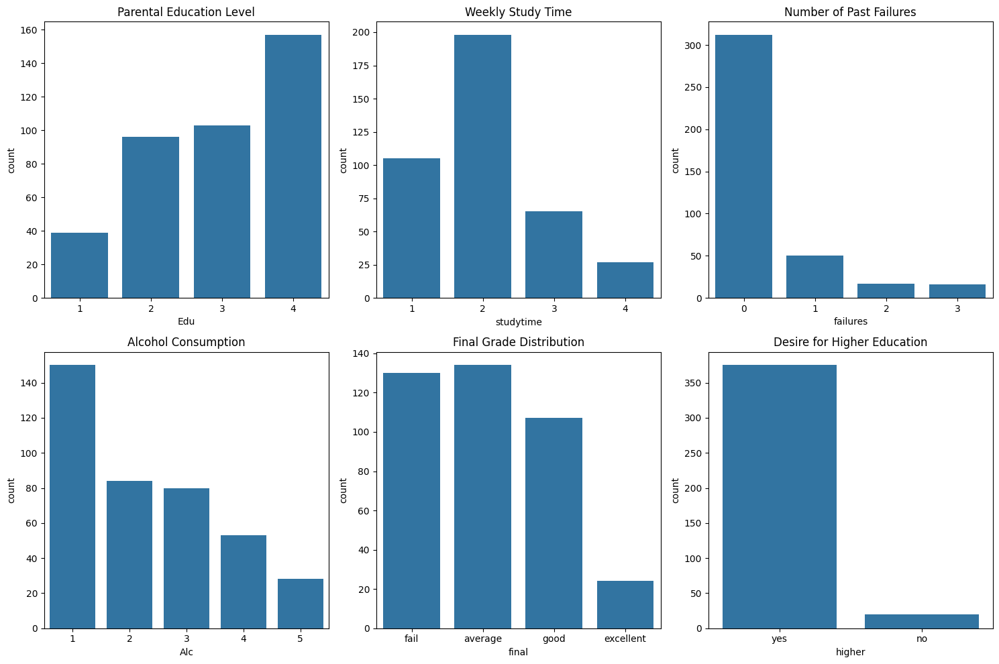

In [ ]:
# Set up the figure
plt.figure(figsize=(15, 10))

# Plot distributions for key variables
plt.subplot(2, 3, 1)
sns.countplot(x='Edu', data=student_df)
plt.title('Parental Education Level')

plt.subplot(2, 3, 2)
sns.countplot(x='studytime', data=student_df)
plt.title('Weekly Study Time')

plt.subplot(2, 3, 3)
sns.countplot(x='failures', data=student_df)
plt.title('Number of Past Failures')

plt.subplot(2, 3, 4)
sns.countplot(x='Alc', data=student_df)
plt.title('Alcohol Consumption')

plt.subplot(2, 3, 5)
sns.countplot(x='final', data=student_df, order=['fail', 'average', 'good', 'excellent'])
plt.title('Final Grade Distribution')

plt.subplot(2, 3, 6)
sns.countplot(x='higher', data=student_df)
plt.title('Desire for Higher Education')

plt.tight_layout()
plt.show()

### 2. Bayes' net structure

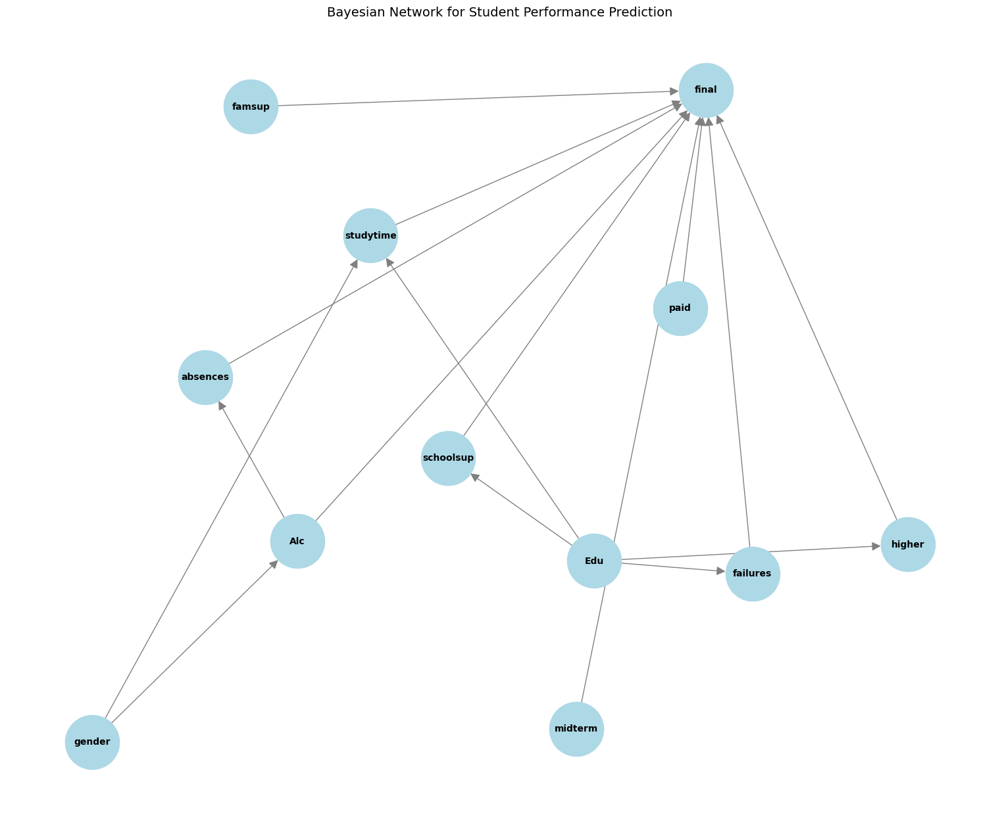

In [ ]:
# Define the model structure
model = BayesianModel([
    ('Edu', 'studytime'),
    ('Edu', 'higher'),
    ('Edu', 'failures'),
    ('Edu', 'schoolsup'),
    ('gender', 'studytime'),
    ('gender', 'Alc'),
    ('studytime', 'final'),
    ('failures', 'final'),
    ('schoolsup', 'final'),
    ('famsup', 'final'),
    ('paid', 'final'),
    ('Alc', 'final'),
    ('Alc', 'absences'),
    ('higher', 'final'),
    ('absences', 'final'),
    ('midterm', 'final')
])

# Create a NetworkX graph for visualization
G = nx.DiGraph()
G.add_edges_from(model.edges())

# Visualize the network
plt.figure(figsize=(15, 12))
pos = nx.spring_layout(G, k=0.5, iterations=50)
nx.draw(G, pos=pos, with_labels=True, node_size=3500,
        node_color='lightblue', font_size=10, font_weight='bold',
        arrowsize=20, edge_color='gray')
plt.title("Bayesian Network for Student Performance Prediction", size=14)
plt.show()

Justification of Edges:

1.Parental Education (Edu): This is a key background variable that influences

many aspects:

* More educated parents likely encourage more study time
* They likely instill higher education aspirations
* They can help prevent failures through better support
* They may be more proactive in seeking school support

2.Gender: We include gender as it might influence study habits and alcohol consumption patterns.

3.Study-related factors: All these (studytime, failures, schoolsup, famsup, paid) directly impact final grades.

4.Alcohol consumption: Higher alcohol use might lead to more absences and worse grades.

5.Midterm grades: These are a strong predictor of final grades.

6.Desire for higher education: Students who want to pursue higher education may be more motivated to get better grades.

### 3. Bayes' net parameter estimation

In [ ]:
# Parameter learning is conducted using MLE
model.fit(student_df, estimator=MaximumLikelihoodEstimator)

# Print the Conditional probability table (CPT) for each node
for cpd in model.get_cpds():
    print(f"CPD of {cpd.variable}:")
    print(cpd)
    print("\n")

CPD of Alc:
+--------+----------------------+---------------------+
| gender | gender(F)            | gender(M)           |
+--------+----------------------+---------------------+
| Alc(1) | 0.4519230769230769   | 0.2994652406417112  |
+--------+----------------------+---------------------+
| Alc(2) | 0.2403846153846154   | 0.18181818181818182 |
+--------+----------------------+---------------------+
| Alc(3) | 0.21634615384615385  | 0.18716577540106952 |
+--------+----------------------+---------------------+
| Alc(4) | 0.07211538461538461  | 0.20320855614973263 |
+--------+----------------------+---------------------+
| Alc(5) | 0.019230769230769232 | 0.12834224598930483 |
+--------+----------------------+---------------------+


CPD of Edu:
+--------+-----------+
| Edu(1) | 0.0987342 |
+--------+-----------+
| Edu(2) | 0.243038  |
+--------+-----------+
| Edu(3) | 0.260759  |
+--------+-----------+
| Edu(4) | 0.397468  |
+--------+-----------+


CPD of absences:
+-------------+-----

### 4. Queries and discussion:

In [ ]:
# Set up the reasoner
inference = VariableElimination(model)

#### Query 1: Effect of Parental Education on Final Grade

In [ ]:
# Low educated parents (Edu = 1)
query1a = inference.query(variables=['final'], evidence={'Edu': 1})
print("\nFinal grade distribution for students with less educated parents (Edu=0):")
print(query1a)

# High educated parents (Edu = 4)
query1 = inference.query(variables=['final'], evidence={'Edu': 4})
print("\nFinal grade distribution for students with highly educated parents (Edu=4):")
print(query1)

Eliminating: famsup: 100%|██████████| 10/10 [00:03<00:00,  3.02it/s]



Final grade distribution for students with less educated parents (Edu=0):
+------------------+--------------+
| final            |   phi(final) |
+==================+==============+
| final(average)   |       0.2691 |
+------------------+--------------+
| final(excellent) |       0.1933 |
+------------------+--------------+
| final(fail)      |       0.2766 |
+------------------+--------------+
| final(good)      |       0.2610 |
+------------------+--------------+


Eliminating: famsup: 100%|██████████| 10/10 [00:02<00:00,  3.46it/s]


Final grade distribution for students with highly educated parents (Edu=4):
+------------------+--------------+
| final            |   phi(final) |
+==================+==============+
| final(average)   |       0.2930 |
+------------------+--------------+
| final(excellent) |       0.1548 |
+------------------+--------------+
| final(fail)      |       0.2669 |
+------------------+--------------+
| final(good)      |       0.2854 |
+------------------+--------------+


When we condition on students whose parents have a high level of education (Edu=4), the final grade distribution shows that "average" (29.30%) and "good" (28.54%) are the most likely outcomes, while the probability of "fail" is slightly lower (26.69%) and "excellent" remains relatively low (15.48%).

For students whose parents have no formal education (Edu=0), the probability of "fail" (27.66%) increases slightly, and the probability of achieving "good" grades (26.10%) decreases compared to those with highly educated parents. The probability of achieving "excellent" grades (19.33%) is slightly higher, but still relatively low overall.

Overall, students with highly educated parents are slightly more likely to perform well ("good" or "average") and slightly less likely to fail, suggesting that parental education provides a modest but positive influence on academic performance.


#### Query 2: Effect of Midterm Grade on Final Grade

In [ ]:
# Low midterm grade (midterm = fail)
query2_fail = inference.query(variables=['final'], evidence={'midterm': 'fail'})
print("\nFinal grades for students who failed midterm (midterm=fail):")
print(query2_fail)

# High midterm grade (midterm = good)
query2_good = inference.query(variables=['final'], evidence={'midterm': 'good'})
print("\nFinal grades for students who did well on midterm (midterm=good):")
print(query2_good)

Eliminating: famsup: 100%|██████████| 10/10 [00:05<00:00,  1.67it/s]



Final grades for students who failed midterm (midterm=fail):
+------------------+--------------+
| final            |   phi(final) |
+==================+==============+
| final(average)   |       0.2670 |
+------------------+--------------+
| final(excellent) |       0.1575 |
+------------------+--------------+
| final(fail)      |       0.4179 |
+------------------+--------------+
| final(good)      |       0.1575 |
+------------------+--------------+


Eliminating: famsup: 100%|██████████| 10/10 [00:06<00:00,  1.61it/s]


Final grades for students who did well on midterm (midterm=good):
+------------------+--------------+
| final            |   phi(final) |
+==================+==============+
| final(average)   |       0.2033 |
+------------------+--------------+
| final(excellent) |       0.1877 |
+------------------+--------------+
| final(fail)      |       0.1437 |
+------------------+--------------+
| final(good)      |       0.4652 |
+------------------+--------------+


When we examine students who failed their midterm exams (midterm=fail), the final grade distribution reveals that "fail" (41.79%) is by far the most likely outcome, while the probabilities of achieving "average" (26.70%), "good" (15.75%) and "excellent" (15.75%) grades are all substantially lower and roughly equal to each other.

For students who performed well on their midterms (midterm=good), we see a completely different pattern. Here, "good" (46.52%) emerges as the most probable final grade outcome, followed by "average" (20.33%), with "excellent" (18.77%) and "fail" (14.37%) being significantly less likely.

The contrast between these two groups is striking. Students who struggled on midterms are nearly three times more likely to fail their finals compared to those who did well (41.79% vs 14.37%). Conversely, strong midterm performers are about three times more likely to achieve good final grades compared to those who failed midterms (46.52% vs 15.75%).

These results suggest that midterm performance serves as a powerful predictor of final outcomes. The strong persistence in performance levels - whether poor or good - from midterm to final exams indicates that early academic performance establishes momentum that tends to continue throughout the course. This highlights the importance of early identification of struggling students and timely academic interventions to help improve their trajectory before final assessments.

#### Query 3: Effect of Alcohol Consumption on Final Grade

In [ ]:
# Low alcohol consumption (Alc = 1)
query3_low_alc = inference.query(variables=['final'], evidence={'Alc': 1})
print("\nFinal grades for students with low alcohol consumption (Alc=1):")
print(query3_low_alc)

# High alcohol consumption (Alc = 5)
query3_high_alc = inference.query(variables=['final'], evidence={'Alc': 5})
print("\nFinal grades for students with high alcohol consumption (Alc=5):")
print(query3_high_alc)

Eliminating: famsup: 100%|██████████| 10/10 [00:01<00:00,  9.08it/s]



Final grades for students with low alcohol consumption (Alc=1):
+------------------+--------------+
| final            |   phi(final) |
+==================+==============+
| final(average)   |       0.2454 |
+------------------+--------------+
| final(excellent) |       0.1556 |
+------------------+--------------+
| final(fail)      |       0.3067 |
+------------------+--------------+
| final(good)      |       0.2923 |
+------------------+--------------+


Eliminating: famsup: 100%|██████████| 10/10 [00:01<00:00,  7.73it/s]


Final grades for students with high alcohol consumption (Alc=5):
+------------------+--------------+
| final            |   phi(final) |
+==================+==============+
| final(average)   |       0.2761 |
+------------------+--------------+
| final(excellent) |       0.2125 |
+------------------+--------------+
| final(fail)      |       0.2327 |
+------------------+--------------+
| final(good)      |       0.2786 |
+------------------+--------------+


When examining students with low alcohol consumption (Alc=1), the final grade distribution shows that "fail" (30.67%) is the most likely outcome, followed closely by "good" (29.23%), while "average" (24.54%) and "excellent" (15.56%) grades are less probable. This suggests that even among students who drink less, academic performance varies considerably, with a notable proportion struggling to pass.

For students with high alcohol consumption (Alc=5), we observe a different pattern. The probabilities are more evenly distributed, with "good" (27.86%) and "average" (27.61%) being slightly more likely than "fail" (23.27%) or "excellent" (21.25%). Contrary to expectations, the high-consumption group shows lower failure rates and higher excellence rates compared to their low-consumption peers.

Potential Explanations:

1. Social drinkers may develop better peer networks that support academic success

2. High alcohol consumption might correlate with higher socioeconomic status in this sample

3. The relationship between alcohol use and academics may be non-linear

While conventional wisdom suggests alcohol harms academics, these results reveal a more nuanced relationship. The data indicate that higher alcohol consumption correlates with moderately better academic outcomes in this population, though the underlying mechanisms require further investigation. This challenges simple assumptions about the effects of alcohol on student performance.

#### Query 4: Effect of Gender on Final Grade

In [ ]:
# Female students
query_b1 = inference.query(variables=['final'], evidence={'gender': 'F'})
print("\nFinal grade distribution for female students:")
print(query_b1)

# Male students
query_b2 = inference.query(variables=['final'], evidence={'gender': 'M'})
print("\nFinal grade distribution for male students:")
print(query_b2)

Eliminating: famsup: 100%|██████████| 10/10 [00:04<00:00,  2.26it/s]



Final grade distribution for female students:
+------------------+--------------+
| final            |   phi(final) |
+==================+==============+
| final(average)   |       0.2831 |
+------------------+--------------+
| final(excellent) |       0.1651 |
+------------------+--------------+
| final(fail)      |       0.2738 |
+------------------+--------------+
| final(good)      |       0.2780 |
+------------------+--------------+


Eliminating: famsup: 100%|██████████| 10/10 [00:04<00:00,  2.19it/s]


Final grade distribution for male students:
+------------------+--------------+
| final            |   phi(final) |
+==================+==============+
| final(average)   |       0.2874 |
+------------------+--------------+
| final(excellent) |       0.1724 |
+------------------+--------------+
| final(fail)      |       0.2648 |
+------------------+--------------+
| final(good)      |       0.2754 |
+------------------+--------------+


When examining female students, the final grade distribution shows that "average" (28.31%) is the most likely outcome, closely followed by "good" (27.80%) and "fail" (27.38%), while "excellent" (16.51%) remains the least probable result. This reveals a relatively balanced distribution across the three main grade categories for female students.

For male students, we observe a similar pattern with "average" (28.74%) being slightly more common than "good" (27.54%) and "fail" (26.48%), while "excellent" (17.24%) maintains the lowest probability. The distributions for both genders show remarkable similarity in their grade patterns.

Contrary to common stereotypes about gender differences in academic performance, these results demonstrate nearly identical achievement patterns between male and female students. The minimal differences observed (all less than 1 percentage point) suggest that gender plays an insignificant role in determining final grades in this population. This finding emphasizes that academic performance is likely influenced more by other factors than gender in this educational context.

### 5. Presentation and formatting

Through this analysis, we've identified several key factors that impact student achievement in mathematics:
1. Academic Foundations Matter Most

Midterm grades overwhelmingly predict final outcomes, with failure probabilities tripling for struggling students—highlighting the critical importance of early mastery.

2. Support Systems Provide Stability

Parental education demonstrates consistent (if modest) benefits, particularly in reducing failure risk and promoting middle-tier achievement.

3. Behavioral Factors Work in Surprising Ways

The alcohol-performance relationship inverts expectations, while gender differences prove negligible—challenging conventional assumptions about non-academic influences.


The model underscores education's cumulative nature: early wins compound, while initial gaps widen without intervention. These probabilistic insights equip educators to target resources where they yield maximum impact—particularly at pivotal transition points in the learning journey.